# EP2.1: Data augmentation

MAC0417/5768 - Visão e Processamento de Imagens

### Gabriel Bazo
### NUSP: 10277231

As funções de data augmentation serão aplicadas a imagens em níveis de cinza. Portanto, o dataset original precisará ser convertido para níveis de cinza. Deve-se criar 5 funções de data augmentation. Cada função será aplicada a cada imagem do dataset do EP1. Assim, o augmentedDataset terá 5X o tamanho do original. Cada grupo deve implementar as seguintes funções de data augmentation:

- RGB2gray (ie converter as imagens RGB originais em níveis de cinza)
- Soma de fundo com gradiente de níveis de cinza
- Logaritmo da imagem
- Exponencial da imagem
- Filtro da média implementado usando convolução

Deve-se usar as funções do EP1 para visualização dos resultados do augmentedDataSet.

## Link para o banco de imagens

https://drive.google.com/drive/folders/1dt4AzHLzmXjKoj1Knm4JLJ1qDdoQFuBo?usp=sharing

## Link para os metadados

https://drive.google.com/file/d/13yqDY7XBFOEQbQSSim4BWnlU3M3Vr6ag/view?usp=sharing

## Link para o GitHub

https://github.com/gbazo/MAC0417-5768-CV

# Codebook

Formato do norme do arquivo: classe + sequencia da imagem + extensão

Exemplo: 101.jpg - imagem numero 1 da classe xicara de chá, formato 'jpg'

Classes
1 - xicara_cha
2 - mini_tigela
3 - xicara_cafe
4 - faca
5 - garfo
6 - colher
7 - garrafa
8 - taça
9 - tigela
10 - prato

Fundos
1 - branco
2 - mármore
3 - mogno
4 - sacada
5 - prateado
6 - marrom

Local
1 - interior
2 - exterior

Periodo
1 - dia
2 - noite

# Tabela sumária global

Classes   | Total imagens | Resolução | Tamanho da Base (mb) |
--------- | ------------- | --------- | -------------------- |
 10       | 1080          | 1920x1080 |    413.9             |

# Metadados

Visualização dos metadados com as caracteristicas do banco de imagens

In [1]:
import pandas as pd
#pd.set_option('display.max_rows', None) #imprime todas as linhas

In [2]:
# o diretório deve ser ajustado para o local onde o arquivo foi salvo
metadados = pd.read_csv("/home/gabriel/Documentos/EP1 CV/metadados.csv")

In [3]:
metadados

,ID,Nome,Classe,Fundo,Local,Período,Seq
0,1,101.jpg,1,1,1,1,1
1,2,102.jpg,1,1,1,1,2
2,3,103.jpg,1,1,1,1,3
3,4,104.jpg,1,1,1,1,4
4,5,105.jpg,1,1,1,1,5
...,...,...,...,...,...,...,...
1075,1076,10104.jpg,10,1,1,2,104
1076,1077,10105.jpg,10,1,1,2,105
1077,1078,10106.jpg,10,1,1,2,106
1078,1079,10107.jpg,10,1,1,2,107


# Visualização MNIST

Geração da visualização das imagens contidas na base de dados em formato semelhante do banco MNIST

In [1]:
import glob
from skimage.io import imread, imshow
import matplotlib.pyplot as plt
from matplotlib.colors import NoNorm

In [2]:
# o diretório deve ser ajustado para o local onde o arquivo foi salvo
images = glob.glob("/home/gabriel/Documentos/EP1 CV/*.jpg")

In [12]:
images[0:3]

['/home/gabriel/Documentos/EP1 CV/147.jpg',
 '/home/gabriel/Documentos/EP1 CV/1107.jpg',
 '/home/gabriel/Documentos/EP1 CV/193.jpg']

In [ ]:
image_list = []

for i in range(0, len(images)):
    image_list.append(imread(images[i]))
    print('read ', images[i])

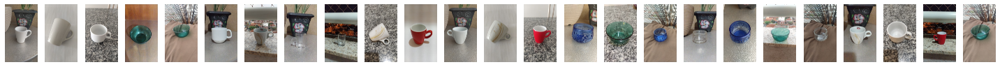

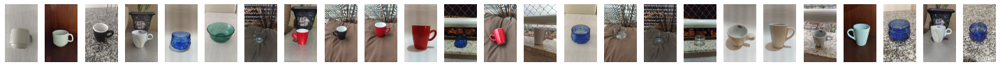

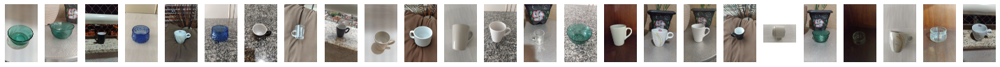

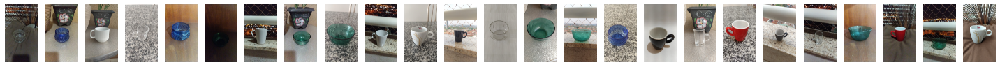

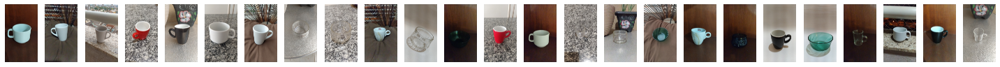

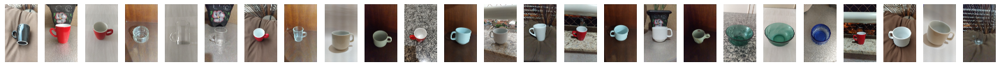

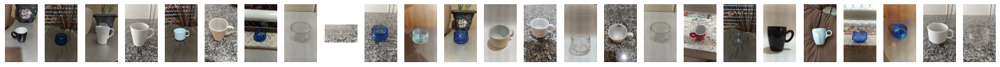

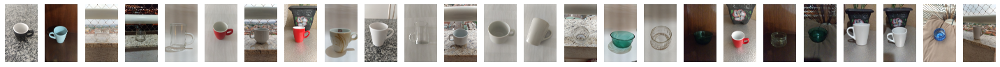

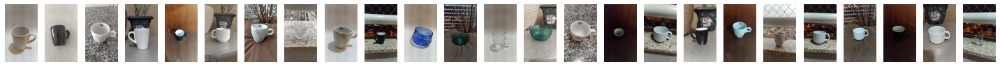

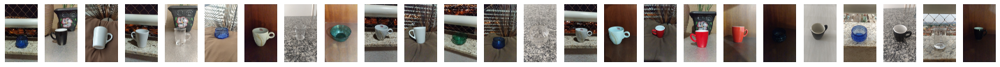

In [33]:
for k in range(10):
    fig, axes = plt.subplots(1, 25, figsize=(20, 20))
    ax = axes.ravel()
    for i in range(25):
        ax[i].imshow(image_list[i+k*25])
        ax[i].axis('off')
    fig.tight_layout()
    plt.show()

# Escala de Cinza

In [2]:
import matplotlib.pyplot as plt

from skimage import data
from skimage.color import rgb2gray

In [ ]:
# diretorios locais
raiz = ("/home/gabriel/Documentos/EP1 CV/")
classes = ['1 - xicara_cha', '2 - mini_tigela', '3 - xicara_cafe', '4 - faca', '5 - garfo', '6 - colher', '7 - garrafa', '8 - taça', '9 - tigela', '10 - prato']

In [ ]:
# formação dos caminhos das imagens
images = []

for k in classes:
    images.append(glob.glob(raiz + k + "/*.jpg"))

In [ ]:
# leitura das imagens
image_list = []

for a in images:
    for x in a:
        image_list.append(imread(x))
    print('read ', x) # ira imprimei somento o ultimo elemento lido da determinada classe

In [ ]:
# conversão para escala de cinza
for i in range(0, len(image_list)):
    grayscale = rgb2gray(image_list[i])
    plt.imsave("/home/gabriel/Documentos/EP1 CV/"+str(i)+"_gray.jpg", grayscale, cmap='gray') 

In [4]:
gray = glob.glob("/home/gabriel/Documentos/EP1 CV/*.jpg")

In [5]:
gray_image_list = []

for i in range(0, len(gray)):
    gray_image_list.append(imread(gray[i]))

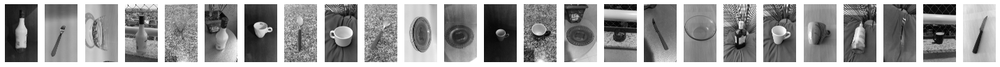

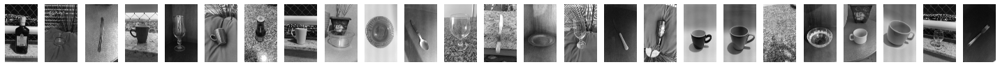

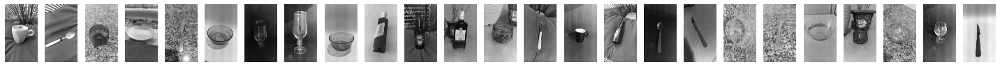

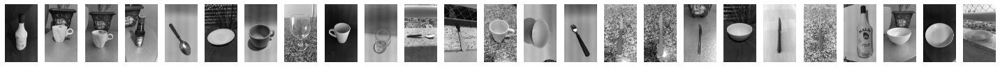

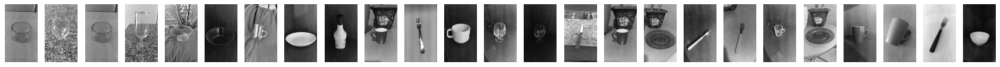

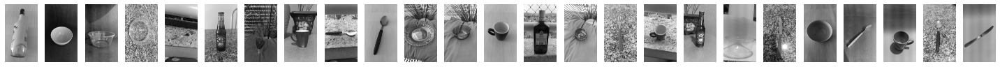

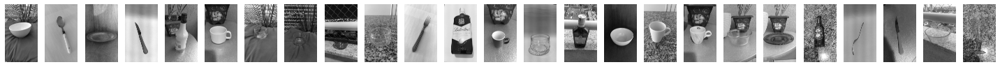

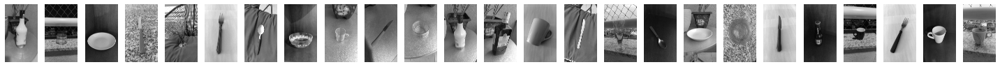

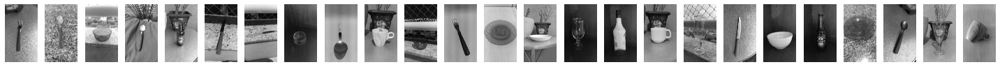

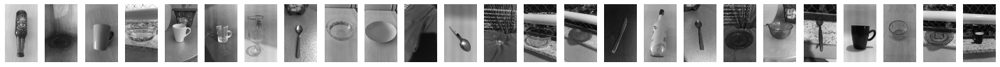

In [6]:
# geração da visualização semelhante a do EP1
for k in range(10):
    fig, axes = plt.subplots(1, 25, figsize=(20, 20))
    ax = axes.ravel()
    for i in range(25):
        ax[i].imshow(gray_image_list[i+k*25])
        ax[i].axis('off')
    fig.tight_layout()
    plt.show()

# Soma de Fundo com Gradiente em Níveis de Cinza

In [7]:
gradient = imread('/home/gabriel/Imagens/gradientmask.png')

In [ ]:
gradient = rgb2gray(gradient)

In [9]:
gradient.shape

(1920, 1080)

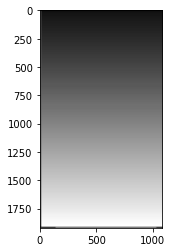

In [12]:
# gradient mask utilizado 
plt.imshow(gradient, cmap='gray',norm=NoNorm())

In [14]:
images = glob.glob("/home/gabriel/Documentos/EP1 CV/*.jpg")

In [15]:
images[0:3]

['/home/gabriel/Documentos/EP1 CV/694_gray.jpg',
 '/home/gabriel/Documentos/EP1 CV/449_gray.jpg',
 '/home/gabriel/Documentos/EP1 CV/950_gray.jpg']

In [ ]:
image_list = []

for i in range(0, len(images)):
    image_list.append(imread(images[i]))
print('read ', images[i])

In [ ]:
# aplicação do filtro nas imagens
for i in range(0, len(image_list)):
    grayscale = rgb2gray(image_list[i])
    soma_images = gradient*1.0 + grayscale*1.0
    mask = soma_images > 255
    soma_images[mask] = 255
    soma_images = soma_images.astype('uint8')
    plt.imsave("/home/gabriel/Documentos/soma/"+str(i)+"_soma.jpg", soma_images, cmap='gray') 

In [3]:
soma = glob.glob("/home/gabriel/Documentos/soma/*.jpg")

In [5]:
soma_image_list = []

for i in range(0, len(soma)):
    soma_image_list.append(imread(soma[i]))

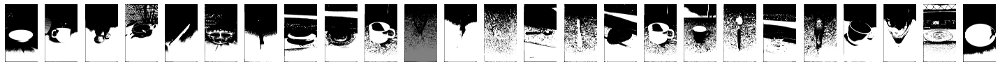

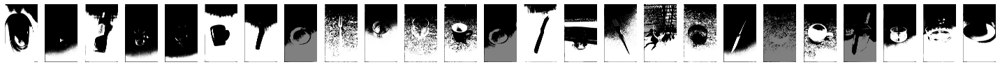

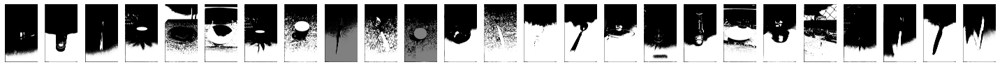

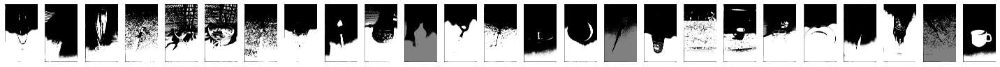

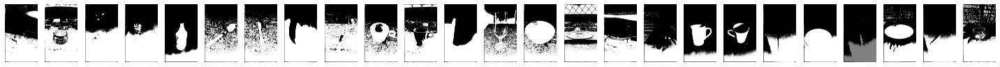

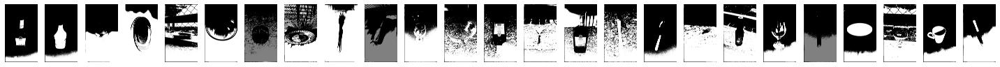

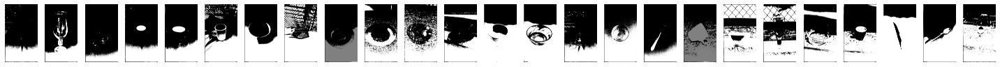

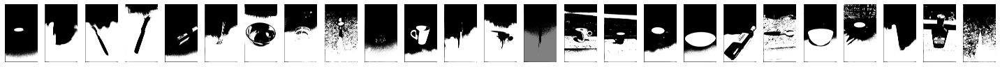

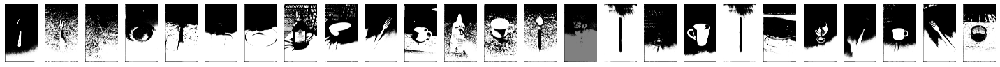

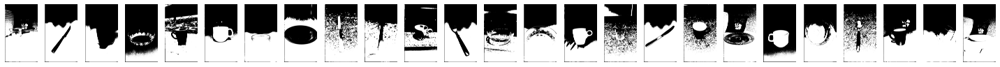

In [6]:
# geração da visualização semelhante a do EP1
for k in range(10):
    fig, axes = plt.subplots(1, 25, figsize=(20, 20))
    ax = axes.ravel()
    for i in range(25):
        ax[i].imshow(soma_image_list[i+k*25])
        ax[i].axis('off')
    fig.tight_layout()
    plt.show()

# Logaritmo da Imagem

In [ ]:
import numpy as np

In [7]:
images = glob.glob("/home/gabriel/Documentos/EP1 CV/*.jpg")

In [8]:
images[0:3]

['/home/gabriel/Documentos/EP1 CV/694_gray.jpg',
 '/home/gabriel/Documentos/EP1 CV/449_gray.jpg',
 '/home/gabriel/Documentos/EP1 CV/950_gray.jpg']

In [ ]:
image_list = []

for i in range(0, len(images)):
    image_list.append(imread(images[i]))
print('read ', images[i])

In [ ]:
# calculo do log das imagens
for i in range(0, len(image_list)):
    grayscale = rgb2gray(image_list[i])
    c = 255/np.log(256)
    log_image = c*np.log(1.0 + grayscale)
    plt.imsave("/home/gabriel/Documentos/log/"+str(i)+"_log.jpg", log_image, cmap='gray')

In [3]:
log = glob.glob("/home/gabriel/Documentos/log/*.jpg")

In [5]:
log_image_list = []

for i in range(0, len(log)):
    log_image_list.append(imread(log[i]))

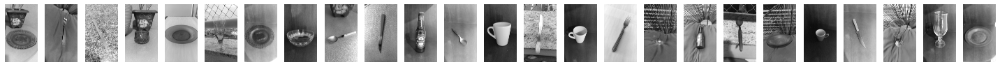

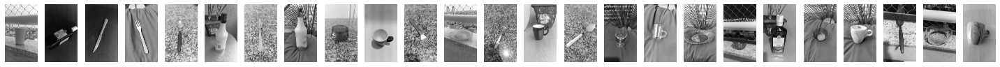

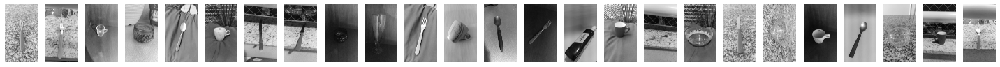

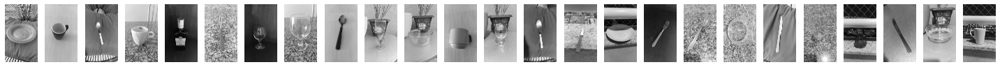

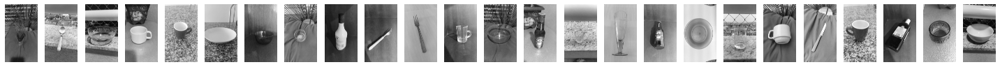

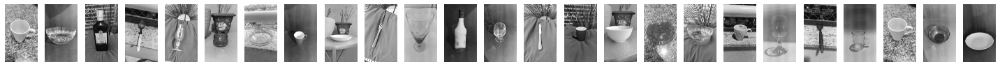

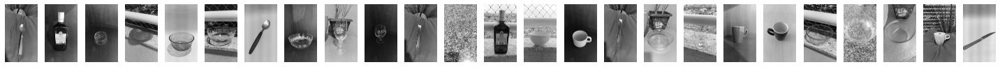

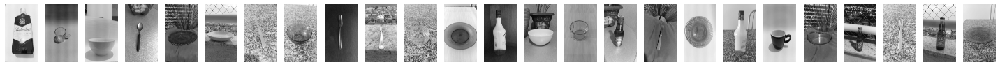

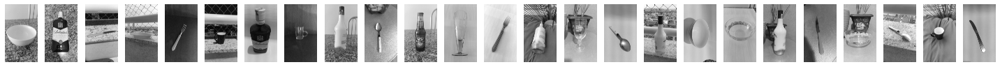

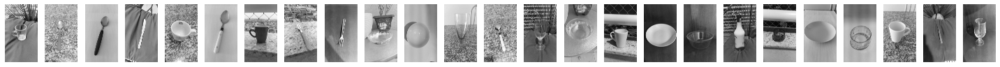

In [6]:
# geração da visualização semelhante a do EP1
for k in range(10):
    fig, axes = plt.subplots(1, 25, figsize=(20, 20))
    ax = axes.ravel()
    for i in range(25):
        ax[i].imshow(log_image_list[i+k*25])
        ax[i].axis('off')
    fig.tight_layout()
    plt.show()

# Exponencial da imagem

In [ ]:
images = glob.glob("/home/gabriel/Documentos/EP1 CV/*.jpg")

In [ ]:
images[0:3]

In [ ]:
image_list = []

for i in range(0, len(images)):
    image_list.append(imread(images[i]))
print('read ', images[i])

In [ ]:
# aplicação do filtro exponencial
for i in range(0, len(image_list)):
    grayscale = rgb2gray(image_list[i])
    c = 255/np.exp(256)
    exp_image = c*np.exp(1.0 + grayscale)
    plt.imsave("/home/gabriel/Documentos/exp/"+str(i)+"_exp.jpg", exp_image, cmap='gray')

In [3]:
exp = glob.glob("/home/gabriel/Documentos/exp/*.jpg")

In [4]:
exp_image_list = []

for i in range(0, len(exp)):
    exp_image_list.append(imread(exp[i]))

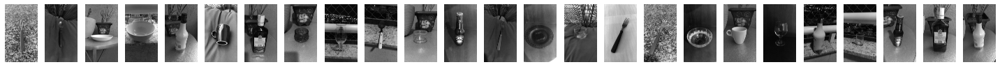

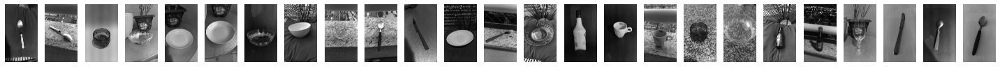

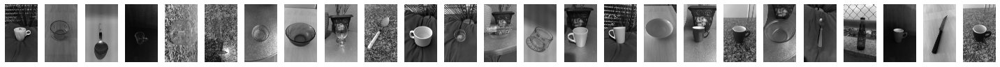

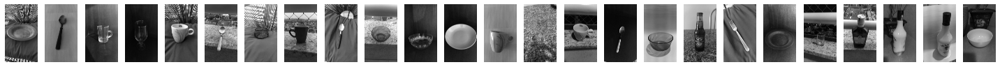

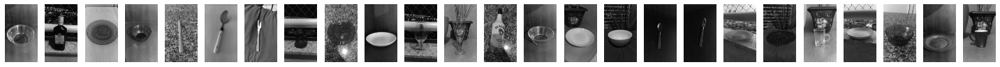

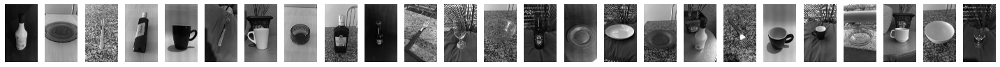

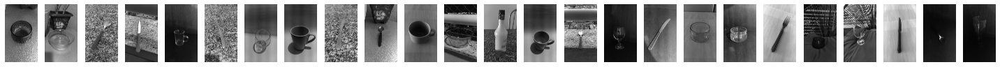

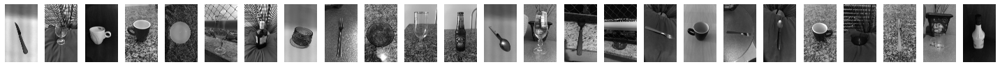

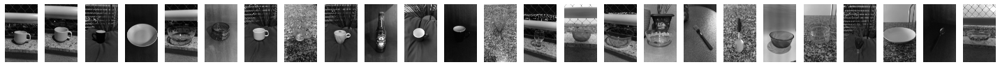

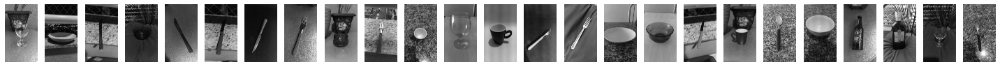

In [5]:
# geração da visualização semelhante a do EP1
for k in range(10):
    fig, axes = plt.subplots(1, 25, figsize=(20, 20))
    ax = axes.ravel()
    for i in range(25):
        ax[i].imshow(exp_image_list[i+k*25])
        ax[i].axis('off')
    fig.tight_layout()
    plt.show()

# Filtro da Média da Imagem

In [ ]:
from scipy.ndimage import convolve

In [7]:
images = glob.glob("/home/gabriel/Documentos/EP1 CV/*.jpg")

In [8]:
images[0:3]

['/home/gabriel/Documentos/EP1 CV/694_gray.jpg',
 '/home/gabriel/Documentos/EP1 CV/449_gray.jpg',
 '/home/gabriel/Documentos/EP1 CV/950_gray.jpg']

In [ ]:
image_list = []

for i in range(0, len(images)):
    image_list.append(imread(images[i]))
print('read ', images[i])

In [ ]:
size=6

In [ ]:
# aplicação do filtro médio na imagem com convolução em modo default (reflect)
for i in range(0, len(image_list)):
    grayscale = rgb2gray(image_list[i])
    shape = (size,size)
    value = 1/pow(size,2)
    kernel = np.full(shape,value)
    conv = convolve(grayscale*1.0, kernel)
    plt.imsave("/home/gabriel/Documentos/kernel/"+str(i)+"_conv.jpg", conv, cmap='gray')

In [3]:
media = glob.glob("/home/gabriel/Documentos/kernel/*.jpg")

In [4]:
media_image_list = []

for i in range(0, len(media)):
    media_image_list.append(imread(media[i]))

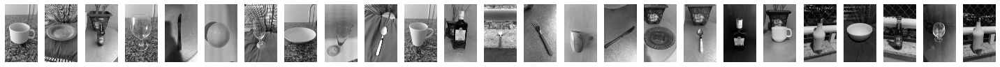

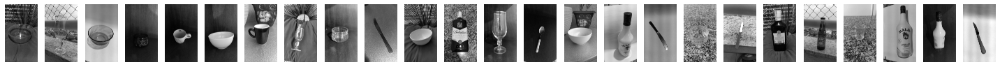

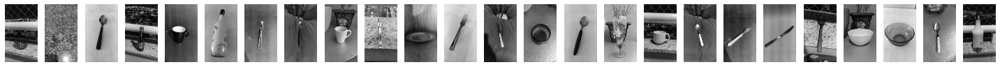

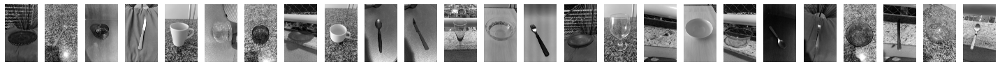

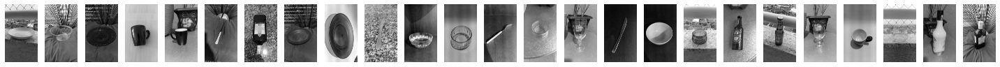

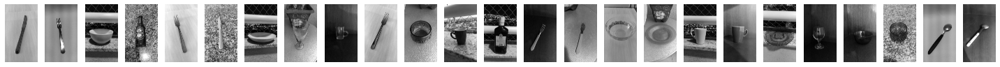

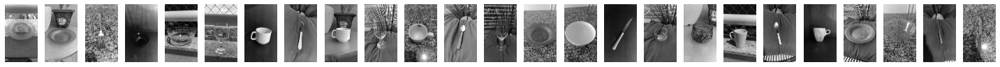

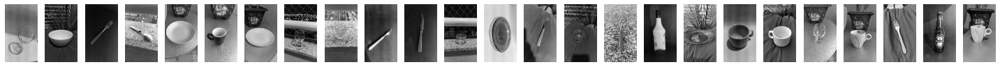

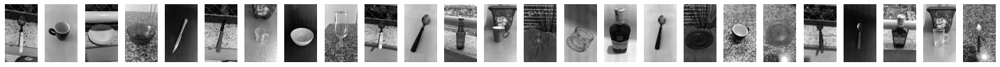

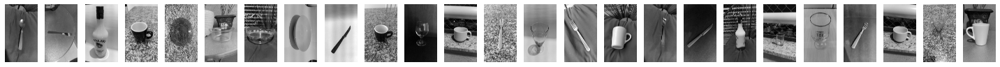

In [5]:
# geração da visualização semelhante a do EP1
for k in range(10):
    fig, axes = plt.subplots(1, 25, figsize=(20, 20))
    ax = axes.ravel()
    for i in range(25):
        ax[i].imshow(media_image_list[i+k*25])
        ax[i].axis('off')
    fig.tight_layout()
    plt.show()

# Resultado Final

- 5400 imagens
- 10 classes
- 1920x1080 pixels
- 1.1 Gigabytes